# 017 - Sklearn DuckDB SQL Regression (CatBoost)

This notebook demonstrates **complete batch ML training** for ETA (Estimated Time of Arrival) regression using:

1. **DuckDB SQL** for data loading and preprocessing from Delta Lake
2. **CatBoost** as primary model (best for categorical features, excellent default performance)
3. **XGBoost** as fallback model
4. **All sklearn regression metrics** for comprehensive evaluation
5. **YellowBrick** for regression visualizations (coming next)

## Model Selection Rationale

Based on extensive research (2024-2025 benchmarks):

| Model | Default Accuracy | Categorical Handling | Tuning Required |
|-------|------------------|---------------------|-----------------|
| **CatBoost** | Best out-of-box | Native, superior | Minimal |
| LightGBM | Very good | Good | More tuning |
| XGBoost | Very good | Requires encoding | Most tuning |

**CatBoost is chosen** for ETA prediction because:
- **61% of ETA features are categorical** (trip_id, driver_id, origin, destination, weather, etc.)
- Native categorical handling without manual encoding
- Best default performance - outperforms XGBoost by 6% on average without tuning
- Ordered boosting reduces overfitting
- Consistency with TFD project (also uses CatBoost)

## Target Variable

- **`simulated_actual_travel_time_seconds`**: Actual travel time in seconds
- This is a continuous regression target

In [72]:
import duckdb
import numpy as np
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import metrics
from catboost import CatBoostRegressor  # Primary model - best for categorical features
from xgboost import XGBRegressor  # Fallback model

In [73]:
MINIO_HOST = "localhost"
MINIO_PORT = "9000"
MINIO_ENDPOINT = f"{MINIO_HOST}:{MINIO_PORT}"
MINIO_ACCESS_KEY = "minioadmin"
MINIO_SECRET_KEY = "minioadmin123"

In [74]:
DELTA_PATHS = {
    "Transaction Fraud Detection": "s3://lakehouse/delta/transaction_fraud_detection",
    "Estimated Time of Arrival": "s3://lakehouse/delta/estimated_time_of_arrival",
    "E-Commerce Customer Interactions": "s3://lakehouse/delta/e_commerce_customer_interactions",
}

In [75]:
# Disable AWS EC2 metadata service lookup (prevents 169.254.169.254 errors)
os.environ["AWS_EC2_METADATA_DISABLED"] = "true"

# Create connection (in-memory database)
conn = duckdb.connect()

# Install and load required extensions
conn.execute("INSTALL delta; LOAD delta;")
conn.execute("INSTALL httpfs; LOAD httpfs;")

# Create a secret for S3/MinIO credentials
conn.execute(f"""
    CREATE SECRET minio_secret (
        TYPE S3,
        KEY_ID '{MINIO_ACCESS_KEY}',
        SECRET '{MINIO_SECRET_KEY}',
        REGION 'us-east-1',
        ENDPOINT '{MINIO_ENDPOINT}',
        URL_STYLE 'path',
        USE_SSL false
    );
""")
print("DuckDB extensions loaded and S3 secret configured")

DuckDB extensions loaded and S3 secret configured


## Feature Definitions

Define features upfront for LightGBM's native categorical handling.

### ETA Features Overview

| Category | Features |
|----------|----------|
| **Numerical** | estimated_distance_km, temperature_celsius, driver_rating, hour_of_day, initial_estimated_travel_time_seconds, debug_traffic_factor, debug_weather_factor, debug_incident_delay_seconds, debug_driver_factor |
| **Categorical** | trip_id, driver_id, vehicle_id, origin, destination, weather, day_of_week, vehicle_type |
| **Temporal** | year, month, day, hour, minute, second (extracted from timestamp) |

In [76]:
# Feature definitions for Estimated Time of Arrival
ETA_NUMERICAL_FEATURES = [
    "estimated_distance_km",
    "temperature_celsius",
    "driver_rating",
    "hour_of_day",
    "initial_estimated_travel_time_seconds",
    "debug_traffic_factor",
    "debug_weather_factor",
    "debug_incident_delay_seconds",
    "debug_driver_factor",
]

ETA_CATEGORICAL_FEATURES = [
    # IDs (high cardinality - label encoded)
    "trip_id",
    "driver_id",
    "vehicle_id",
    # Locations
    "origin",
    "destination",
    # Context
    "weather",
    "day_of_week",
    "vehicle_type",
    # Temporal (extracted from timestamp)
    "year",
    "month",
    "day",
    "hour",
    "minute",
    "second",
]

ETA_ALL_FEATURES = ETA_NUMERICAL_FEATURES + ETA_CATEGORICAL_FEATURES

# Categorical feature indices for LightGBM (position in feature list)
ETA_CAT_FEATURE_INDICES = list(range(
    len(ETA_NUMERICAL_FEATURES),
    len(ETA_ALL_FEATURES)
))

# Categorical feature names for LightGBM
ETA_CAT_FEATURE_NAMES = ETA_CATEGORICAL_FEATURES

print(f"Numerical features: {len(ETA_NUMERICAL_FEATURES)}")
print(f"Categorical features: {len(ETA_CATEGORICAL_FEATURES)}")
print(f"Categorical indices: {ETA_CAT_FEATURE_INDICES}")

Numerical features: 9
Categorical features: 14
Categorical indices: [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]


## DuckDB SQL Preprocessing

All categorical features are **label-encoded in SQL** using `DENSE_RANK() - 1`.

This produces numeric data compatible with:
- LightGBM (pass `categorical_feature` for native handling)
- XGBoost (works directly with integers)
- YellowBrick (requires numeric data)
- All sklearn tools

In [77]:
def load_data_duckdb_sql(
    delta_path: str,
    sample_frac: float | None = None,
    max_rows: int | None = None,
) -> pd.DataFrame:
    """
    Load and preprocess ETA data using pure DuckDB SQL.
    
    All categorical features are label-encoded using DENSE_RANK() - 1.
    This produces numeric data compatible with:
    - LightGBM (pass categorical_feature for native handling)
    - XGBoost (works directly with integers)
    - YellowBrick (requires numeric data)
    - All sklearn tools
    
    Args:
        delta_path: Path to Delta Lake table
        sample_frac: Optional fraction of data to sample (0.0-1.0)
        max_rows: Optional maximum number of rows to load
    
    Returns:
        DataFrame with preprocessed features (all numeric) and target
    """
    # Single query: All features numeric, categoricals label-encoded
    query = f"""
    SELECT
        -- Numerical features (unchanged)
        estimated_distance_km,
        temperature_celsius,
        driver_rating,
        hour_of_day,
        initial_estimated_travel_time_seconds,
        debug_traffic_factor,
        debug_weather_factor,
        debug_incident_delay_seconds,
        debug_driver_factor,

        -- Categorical features: Label encoded with DENSE_RANK() - 1
        -- This produces 0-indexed integers compatible with all ML tools
        DENSE_RANK() OVER (ORDER BY trip_id) - 1 AS trip_id,
        DENSE_RANK() OVER (ORDER BY driver_id) - 1 AS driver_id,
        DENSE_RANK() OVER (ORDER BY vehicle_id) - 1 AS vehicle_id,
        DENSE_RANK() OVER (ORDER BY origin) - 1 AS origin,
        DENSE_RANK() OVER (ORDER BY destination) - 1 AS destination,
        DENSE_RANK() OVER (ORDER BY weather) - 1 AS weather,
        DENSE_RANK() OVER (ORDER BY day_of_week) - 1 AS day_of_week,
        DENSE_RANK() OVER (ORDER BY vehicle_type) - 1 AS vehicle_type,

        -- Timestamp components (already integers)
        CAST(date_part('year', CAST(timestamp AS TIMESTAMP)) AS INTEGER) AS year,
        CAST(date_part('month', CAST(timestamp AS TIMESTAMP)) AS INTEGER) AS month,
        CAST(date_part('day', CAST(timestamp AS TIMESTAMP)) AS INTEGER) AS day,
        CAST(date_part('hour', CAST(timestamp AS TIMESTAMP)) AS INTEGER) AS hour,
        CAST(date_part('minute', CAST(timestamp AS TIMESTAMP)) AS INTEGER) AS minute,
        CAST(date_part('second', CAST(timestamp AS TIMESTAMP)) AS INTEGER) AS second,

        -- Target (continuous - travel time in seconds)
        simulated_actual_travel_time_seconds

    FROM delta_scan('{delta_path}')
    """
    
    print(f"Loading ETA data with DuckDB SQL (all features numeric)...")

    # Add sampling clause
    if sample_frac is not None and 0 < sample_frac < 1:
        query += f" USING SAMPLE {sample_frac * 100}%"
        print(f"  Sampling: {sample_frac * 100}%")

    # Add limit clause
    if max_rows is not None:
        query += f" LIMIT {max_rows}"
        print(f"  Max rows: {max_rows}")

    df = conn.execute(query).df()
    print(f"  Loaded {len(df):,} rows with {len(df.columns)} columns")
    print(f"  All features numeric: {df.select_dtypes(include=['number']).shape[1]}/{len(df.columns)} columns")
    
    return df

In [78]:
# Set model type for training
MODEL_TYPE = "catboost"  # "catboost" (primary) or "xgboost" (fallback)

# Load data from Delta Lake
df = load_data_duckdb_sql(
    DELTA_PATHS["Estimated Time of Arrival"],
    max_rows=10000
)

Loading ETA data with DuckDB SQL (all features numeric)...
  Max rows: 10000


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Loaded 10,000 rows with 24 columns
  All features numeric: 24/24 columns


In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   estimated_distance_km                  10000 non-null  float64
 1   temperature_celsius                    10000 non-null  float64
 2   driver_rating                          10000 non-null  float64
 3   hour_of_day                            10000 non-null  int32  
 4   initial_estimated_travel_time_seconds  10000 non-null  int32  
 5   debug_traffic_factor                   10000 non-null  float64
 6   debug_weather_factor                   10000 non-null  float64
 7   debug_incident_delay_seconds           10000 non-null  int32  
 8   debug_driver_factor                    10000 non-null  float64
 9   trip_id                                10000 non-null  int64  
 10  driver_id                              10000 non-null  int64  
 11  veh

In [80]:
# Check target variable distribution
print("Target Variable Statistics (simulated_actual_travel_time_seconds):")
print(df["simulated_actual_travel_time_seconds"].describe())
print(f"\nTarget range: {df['simulated_actual_travel_time_seconds'].min():.0f} - {df['simulated_actual_travel_time_seconds'].max():.0f} seconds")
print(f"Target range in minutes: {df['simulated_actual_travel_time_seconds'].min()/60:.1f} - {df['simulated_actual_travel_time_seconds'].max()/60:.1f} minutes")

Target Variable Statistics (simulated_actual_travel_time_seconds):
count    10000.000000
mean      4523.655800
std       2476.274172
min         60.000000
25%       2695.750000
50%       4206.000000
75%       5983.250000
max      25471.000000
Name: simulated_actual_travel_time_seconds, dtype: float64

Target range: 60 - 25471 seconds
Target range in minutes: 1.0 - 424.5 minutes


## Process Batch Data

Split features/target and prepare for training.

Data is **already all-numeric** from DuckDB SQL preprocessing.

In [81]:
def process_batch_data_duckdb(
    df: pd.DataFrame,
    test_size: float = 0.2,
    random_state: int = 42,
):
    """
    Process batch data for model training.
    
    Data is already all-numeric from load_data_duckdb_sql().
    Works with both LightGBM (pass categorical_feature) and XGBoost.
    
    Args:
        df: DataFrame from load_data_duckdb_sql() (all numeric)
        test_size: Fraction for test set
        random_state: Random seed
    
    Returns:
        X_train, X_test, y_train, y_test
    """
    # Split features and target
    y = df["simulated_actual_travel_time_seconds"]
    X = df.drop("simulated_actual_travel_time_seconds", axis=1)
    
    print(f"Features: {len(X.columns)} total ({len(ETA_NUMERICAL_FEATURES)} numeric, {len(ETA_CATEGORICAL_FEATURES)} label-encoded)")
    print(f"All features are numeric - compatible with YellowBrick and sklearn tools")
    
    # Train/test split (no stratification for regression)
    print(f"Splitting data: {1-test_size:.0%} train, {test_size:.0%} test...")
    X_train, X_test, y_train, y_test = train_test_split(
        X, y,
        test_size=test_size,
        random_state=random_state,
    )
    
    print(f"  Training set: {len(X_train):,} samples")
    print(f"  Test set: {len(X_test):,} samples")
    
    # Target statistics
    print(f"  Target mean (train): {y_train.mean():.1f} seconds ({y_train.mean()/60:.1f} minutes)")
    print(f"  Target std (train): {y_train.std():.1f} seconds")
    
    return X_train, X_test, y_train, y_test

In [82]:
# Process data - same for both model types (data is already numeric)
X_train, X_test, y_train, y_test = process_batch_data_duckdb(df)

Features: 23 total (9 numeric, 14 label-encoded)
All features are numeric - compatible with YellowBrick and sklearn tools
Splitting data: 80% train, 20% test...
  Training set: 8,000 samples
  Test set: 2,000 samples
  Target mean (train): 4512.2 seconds (75.2 minutes)
  Target std (train): 2461.6 seconds


In [83]:
X_train.head()

,estimated_distance_km,temperature_celsius,driver_rating,hour_of_day,initial_estimated_travel_time_seconds,debug_traffic_factor,debug_weather_factor,debug_incident_delay_seconds,debug_driver_factor,trip_id,...,destination,weather,day_of_week,vehicle_type,year,month,day,hour,minute,second
9254,16.80,20.3,3.6,19,1420,1.70,1.0,0,1.04,644320,...,598158,4,4,0,2026,1,16,19,37,36
1561,12.78,18.6,4.9,17,1181,1.85,1.0,0,0.98,191784,...,669296,3,4,0,2026,1,16,17,25,48
1670,37.41,21.7,4.7,2,3068,1.14,1.0,0,0.99,190508,...,535388,1,4,0,2026,1,16,2,13,38
6087,71.57,29.9,4.5,23,6456,1.11,1.0,0,1.00,2009,...,643716,0,4,0,2026,1,16,23,20,44
6669,21.31,25.9,3.7,0,1783,1.07,1.0,0,1.04,10690,...,650627,0,4,0,2026,1,16,0,17,41


In [84]:
X_train.dtypes

estimated_distance_km                    float64
temperature_celsius                      float64
driver_rating                            float64
hour_of_day                                int32
initial_estimated_travel_time_seconds      int32
debug_traffic_factor                     float64
debug_weather_factor                     float64
debug_incident_delay_seconds               int32
debug_driver_factor                      float64
trip_id                                    int64
driver_id                                  int64
vehicle_id                                 int64
origin                                     int64
destination                                int64
weather                                    int64
day_of_week                                int64
vehicle_type                               int64
year                                       int32
month                                      int32
day                                        int32
hour                

## Model Creation (CatBoost Primary, XGBoost Fallback)

### CatBoost (Primary)
Optimal for ETA prediction with categorical features:
- **Native categorical handling** - No need for one-hot or label encoding
- **Best default performance** - Outperforms XGBoost by 6% without tuning
- **Ordered boosting** - Reduces overfitting
- **Symmetric trees** - Faster inference

### XGBoost (Fallback)
For comparison and YellowBrick compatibility:
- Well-documented, mature library
- Strong community support

### Optimal Hyperparameters (Research-Based)

Based on 2024-2025 benchmarks for ETA prediction:

| Parameter | CatBoost | XGBoost | Rationale |
|-----------|----------|---------|-----------|
| learning_rate | 0.05 | 0.05 | Balance speed/accuracy |
| iterations/n_estimators | 1000 | 1000 | With early stopping |
| depth/max_depth | 8 | 8 | Deeper for regression |
| l2_leaf_reg/reg_lambda | 3 | 1.0 | Regularization |
| early_stopping | 50 | 50 | Prevent overfitting |

In [85]:
from typing import Literal

def create_batch_model(
    model_type: Literal["catboost", "xgboost"] = "catboost",
    cat_feature_indices: list[int] | None = None,
):
    """
    Create regressor optimized for ETA prediction.
    
    Args:
        model_type: "catboost" (primary) or "xgboost" (fallback)
        cat_feature_indices: Indices of categorical features (for CatBoost)
    
    Returns:
        Configured regressor ready for training
    
    References:
        - CatBoost docs: https://catboost.ai/docs/en/references/training-parameters/common
        - ETA research: CatBoost excels with categorical features (61% of ETA features)
    """
    if model_type == "catboost":
        print(f"Creating CatBoostRegressor (primary model)")
        if cat_feature_indices:
            print(f"  Categorical feature indices: {cat_feature_indices}")
        
        # Optimized CatBoost parameters for ETA regression
        model = CatBoostRegressor(
            # Core parameters
            iterations=1000,                # Max trees; early stopping finds optimal
            learning_rate=0.05,             # Good balance for large datasets
            depth=8,                        # Deeper for regression (vs 6 for classification)
            
            # Loss function & evaluation (RMSE for regression)
            loss_function='RMSE',
            eval_metric='RMSE',
            
            # Regularization
            l2_leaf_reg=3,                  # L2 regularization (default=3)
            random_strength=1.0,            # Randomness for scoring splits
            bagging_temperature=1.0,        # Bayesian bootstrap
            
            # Boosting type: 'Plain' for large datasets (1M+), 'Ordered' for <100K
            boosting_type='Plain',
            
            # Early stopping
            early_stopping_rounds=50,
            
            # Performance
            task_type='CPU',
            thread_count=-1,                # Use all CPU cores
            random_seed=42,
            
            # Output - verbose for real-time logging
            verbose=True,                   # Show all iterations
        )
    
    elif model_type == "xgboost":
        print(f"Creating XGBRegressor (fallback model)")
        
        # Optimized XGBoost parameters for ETA prediction
        model = XGBRegressor(
            # Core parameters
            n_estimators=1000,              # Max trees; early stopping finds optimal
            learning_rate=0.05,             # Good balance
            max_depth=8,                    # XGBoost prefers shallower
            
            # Regularization
            min_child_weight=5,             # Minimum sum of instance weight
            gamma=0.1,                      # Minimum loss reduction
            reg_alpha=0.1,                  # L1 regularization
            reg_lambda=1.0,                 # L2 regularization
            
            # Sampling
            subsample=0.8,                  # Row sampling
            colsample_bytree=0.8,           # Column sampling
            
            # Objective
            objective='reg:squarederror',
            
            # Performance
            tree_method='hist',             # Faster histogram-based
            n_jobs=-1,
            random_state=42,
        )
    
    else:
        raise ValueError(f"Unknown model_type: {model_type}")
    
    return model

In [86]:
# Create model using MODEL_TYPE defined earlier
model = create_batch_model(
    model_type=MODEL_TYPE,
    cat_feature_indices=ETA_CAT_FEATURE_INDICES if MODEL_TYPE == "catboost" else None,
)

Creating CatBoostRegressor (primary model)
  Categorical feature indices: [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]


## Train Model

Training with all-numeric features (label-encoded in DuckDB SQL).

**CatBoost**: Pass `cat_features` indices for native categorical handling.
**XGBoost**: Works directly with integer-encoded categoricals.

In [87]:
# Train model based on type
if MODEL_TYPE == "catboost":
    # CatBoost training with native categorical support
    print("Training CatBoost with early stopping...")
    print("Showing all iterations...")
    print()
    
    model.fit(
        X_train, y_train,
        eval_set=(X_test, y_test),
        cat_features=ETA_CAT_FEATURE_INDICES,  # Pass indices for native categorical handling
        use_best_model=True,                    # Return best model from early stopping
        plot=False,                             # Disable plotting (for notebook)
    )
    print()
    print(f"Best iteration: {model.best_iteration_}")
    print(f"Best score (RMSE): {model.best_score_['validation']['RMSE']:.4f}")
else:
    # XGBoost training with early stopping
    print("Training XGBoost with early stopping...")
    model.fit(
        X_train, y_train,
        eval_set=[(X_test, y_test)],
        verbose=1,  # Log every iteration
    )
    print(f"Best iteration: {model.best_iteration}")
    print(f"Best score: {model.best_score:.4f}")

Training CatBoost with early stopping...
Showing all iterations...

0:	learn: 2358.5044064	test: 2426.6725085	best: 2426.6725085 (0)	total: 174ms	remaining: 2m 54s
1:	learn: 2260.7187729	test: 2323.8417981	best: 2323.8417981 (1)	total: 381ms	remaining: 3m 10s
2:	learn: 2170.5278665	test: 2229.8467159	best: 2229.8467159 (2)	total: 553ms	remaining: 3m 3s
3:	learn: 2083.5957267	test: 2140.0435843	best: 2140.0435843 (3)	total: 677ms	remaining: 2m 48s
4:	learn: 2001.2884167	test: 2053.6233327	best: 2053.6233327 (4)	total: 847ms	remaining: 2m 48s
5:	learn: 1920.2501121	test: 1968.8310473	best: 1968.8310473 (5)	total: 1.15s	remaining: 3m 9s
6:	learn: 1841.1686126	test: 1885.0968947	best: 1885.0968947 (6)	total: 1.29s	remaining: 3m 2s
7:	learn: 1765.5006211	test: 1807.4069519	best: 1807.4069519 (7)	total: 1.6s	remaining: 3m 18s
8:	learn: 1692.1722201	test: 1732.0738913	best: 1732.0738913 (8)	total: 1.78s	remaining: 3m 15s
9:	learn: 1626.7863279	test: 1664.4234610	best: 1664.4234610 (9)	total: 

## Evaluate Model

In [88]:
y_pred = model.predict(X_test)

## Model Comparison

Compare CatBoost (primary) vs XGBoost (fallback) on this dataset.

Run the notebook twice with `MODEL_TYPE = "catboost"` and `MODEL_TYPE = "xgboost"` to compare.

In [89]:
# -----------------------------------------------------------------------------
# PRIMARY METRICS - Most important for ETA prediction
# These are the industry-standard metrics for travel time estimation
# -----------------------------------------------------------------------------
primary_metric_functions = {
    # MAE: Mean Absolute Error - average absolute difference in seconds
    # Most interpretable: "On average, predictions are off by X seconds"
    "mean_absolute_error": metrics.mean_absolute_error,
    
    # RMSE: Root Mean Squared Error - penalizes large errors more
    # Critical for ETA: large errors are worse than many small ones
    "root_mean_squared_error": metrics.root_mean_squared_error,
    
    # MAPE: Mean Absolute Percentage Error - relative error
    # Industry standard for ETA: "Predictions are off by X%"
    "mean_absolute_percentage_error": metrics.mean_absolute_percentage_error,
    
    # R2: Coefficient of Determination - explained variance ratio
    # How much variance in travel time is explained by the model
    "r2_score": metrics.r2_score,
}
primary_metric_args = {
    "mean_absolute_error": {},
    "root_mean_squared_error": {},
    "mean_absolute_percentage_error": {},
    "r2_score": {},
}

In [90]:
# -----------------------------------------------------------------------------
# SECONDARY METRICS - Additional insights for regression
# -----------------------------------------------------------------------------
secondary_metric_functions = {
    # MSE: Mean Squared Error - used internally for optimization
    "mean_squared_error": metrics.mean_squared_error,
    
    # Median Absolute Error - robust to outliers
    # Useful when there are extreme travel times (accidents, etc.)
    "median_absolute_error": metrics.median_absolute_error,
    
    # Max Error - worst case prediction
    # Important for ETA: what's the worst prediction we could make?
    "max_error": metrics.max_error,
    
    # Explained Variance Score - similar to R2 but doesn't center
    "explained_variance_score": metrics.explained_variance_score,
}
secondary_metric_args = {
    "mean_squared_error": {},
    "median_absolute_error": {},
    "max_error": {},
    "explained_variance_score": {},
}

In [91]:
# -----------------------------------------------------------------------------
# LOGARITHMIC METRICS - For positive targets (travel time > 0)
# Useful when relative errors matter more than absolute errors
# -----------------------------------------------------------------------------
logarithmic_metric_functions = {
    # MSLE: Mean Squared Logarithmic Error
    # Penalizes underestimates more than overestimates
    # Good for ETA: better to overestimate than underestimate travel time
    "mean_squared_log_error": metrics.mean_squared_log_error,
    
    # RMSLE: Root Mean Squared Logarithmic Error
    "root_mean_squared_log_error": metrics.root_mean_squared_log_error,
}
logarithmic_metric_args = {
    "mean_squared_log_error": {},
    "root_mean_squared_log_error": {},
}

In [92]:
# -----------------------------------------------------------------------------
# DEVIANCE METRICS - For generalized linear models / distributional analysis
# -----------------------------------------------------------------------------
deviance_metric_functions = {
    # Mean Poisson Deviance - assumes count/positive data
    "mean_poisson_deviance": metrics.mean_poisson_deviance,
    
    # Mean Gamma Deviance - assumes positive continuous data
    # Good for travel times which are always positive
    "mean_gamma_deviance": metrics.mean_gamma_deviance,
    
    # Mean Tweedie Deviance - generalized (power parameter)
    # power=0: Normal, power=1: Poisson, power=2: Gamma
    "mean_tweedie_deviance": metrics.mean_tweedie_deviance,
}
deviance_metric_args = {
    "mean_poisson_deviance": {},
    "mean_gamma_deviance": {},
    "mean_tweedie_deviance": {"power": 1.5},  # Between Poisson and Gamma
}

In [93]:
# -----------------------------------------------------------------------------
# QUANTILE METRICS - For quantile regression / prediction intervals
# -----------------------------------------------------------------------------
quantile_metric_functions = {
    # Mean Pinball Loss (quantile loss) - for prediction intervals
    # alpha=0.5 is equivalent to MAE (median regression)
    "mean_pinball_loss": metrics.mean_pinball_loss,
}
quantile_metric_args = {
    "mean_pinball_loss": {"alpha": 0.5},  # Median (50th percentile)
}

In [94]:
# -----------------------------------------------------------------------------
# D2 SCORE METRICS - Fraction of deviance explained (like R2 for deviance)
# These are "coefficient of determination" analogs for different loss functions
# -----------------------------------------------------------------------------
d2_metric_functions = {
    # D2 Absolute Error Score - fraction of absolute error explained
    # Similar to R2 but based on MAE instead of MSE
    "d2_absolute_error_score": metrics.d2_absolute_error_score,
    
    # D2 Pinball Score - fraction of pinball loss explained
    "d2_pinball_score": metrics.d2_pinball_score,
    
    # D2 Tweedie Score - fraction of Tweedie deviance explained
    "d2_tweedie_score": metrics.d2_tweedie_score,
}
d2_metric_args = {
    "d2_absolute_error_score": {},
    "d2_pinball_score": {"alpha": 0.5},
    "d2_tweedie_score": {"power": 1.5},
}

## Comprehensive Metrics Evaluation

Sklearn regression metrics organized by category:

| Category | Metrics | Use Case |
|----------|---------|----------|
| **Primary** | MAE, RMSE, MAPE, R2 | Core ETA evaluation |
| **Secondary** | MSE, MedianAE, MaxError, EVS | Additional insights |
| **Logarithmic** | MSLE, RMSLE | Relative errors, positive targets |
| **Deviance** | Poisson, Gamma, Tweedie | Distributional analysis |
| **Quantile** | Pinball Loss | Prediction intervals |
| **D2 Scores** | D2_AE, D2_Pinball, D2_Tweedie | Fraction explained |

In [95]:
# =============================================================================
# COMPUTE ALL METRICS
# =============================================================================
metrics_to_log = {}

# -----------------------------------------------------------------------------
# PRIMARY METRICS
# -----------------------------------------------------------------------------
for name, func in primary_metric_functions.items():
    try:
        metrics_to_log[name] = func(y_test, y_pred, **primary_metric_args[name])
    except Exception as e:
        print(f"Error computing {name}: {e}")

# -----------------------------------------------------------------------------
# SECONDARY METRICS
# -----------------------------------------------------------------------------
for name, func in secondary_metric_functions.items():
    try:
        metrics_to_log[name] = func(y_test, y_pred, **secondary_metric_args[name])
    except Exception as e:
        print(f"Error computing {name}: {e}")

# -----------------------------------------------------------------------------
# LOGARITHMIC METRICS (require positive values)
# -----------------------------------------------------------------------------
# Clip predictions to positive values for log metrics
y_pred_positive = np.maximum(y_pred, 1e-10)
y_test_positive = np.maximum(y_test.values, 1e-10)

for name, func in logarithmic_metric_functions.items():
    try:
        metrics_to_log[name] = func(y_test_positive, y_pred_positive, **logarithmic_metric_args[name])
    except Exception as e:
        print(f"Error computing {name}: {e}")

# -----------------------------------------------------------------------------
# DEVIANCE METRICS (require strictly positive values)
# -----------------------------------------------------------------------------
for name, func in deviance_metric_functions.items():
    try:
        metrics_to_log[name] = func(y_test_positive, y_pred_positive, **deviance_metric_args[name])
    except Exception as e:
        print(f"Error computing {name}: {e}")

# -----------------------------------------------------------------------------
# QUANTILE METRICS
# -----------------------------------------------------------------------------
for name, func in quantile_metric_functions.items():
    try:
        metrics_to_log[name] = func(y_test, y_pred, **quantile_metric_args[name])
    except Exception as e:
        print(f"Error computing {name}: {e}")

# -----------------------------------------------------------------------------
# D2 SCORE METRICS
# -----------------------------------------------------------------------------
for name, func in d2_metric_functions.items():
    try:
        if "tweedie" in name or "pinball" in name:
            metrics_to_log[name] = func(y_test_positive, y_pred_positive, **d2_metric_args[name])
        else:
            metrics_to_log[name] = func(y_test, y_pred, **d2_metric_args[name])
    except Exception as e:
        print(f"Error computing {name}: {e}")

metrics_to_log

{'mean_absolute_error': 53.824629431448805,
 'root_mean_squared_error': 112.4386443497634,
 'mean_absolute_percentage_error': 0.016445197644618305,
 'r2_score': 0.9980302139926175,
 'mean_squared_error': 12642.44874321258,
 'median_absolute_error': 37.669333072704376,
 'max_error': 2626.438707265661,
 'explained_variance_score': 0.9980306557284272,
 'mean_squared_log_error': 0.00147884778086828,
 'root_mean_squared_log_error': 0.038455789952467234,
 'mean_poisson_deviance': 2.1007483771373194,
 'mean_gamma_deviance': 0.0013493388302415212,
 'mean_tweedie_deviance': 0.04197086329083842,
 'mean_pinball_loss': 26.912314715724403,
 'd2_absolute_error_score': 0.9731182833981976,
 'd2_pinball_score': 0.9731182833981976,
 'd2_tweedie_score': 0.998096133435147}

In [96]:
# Display metrics in a readable format
print("=" * 60)
print(f"ETA PREDICTION METRICS ({MODEL_TYPE.upper()})")
print("=" * 60)

print("\n--- PRIMARY METRICS (Industry Standard for ETA) ---")
print(f"MAE:  {metrics_to_log['mean_absolute_error']:.2f} seconds ({metrics_to_log['mean_absolute_error']/60:.2f} minutes)")
print(f"RMSE: {metrics_to_log['root_mean_squared_error']:.2f} seconds ({metrics_to_log['root_mean_squared_error']/60:.2f} minutes)")
print(f"MAPE: {metrics_to_log['mean_absolute_percentage_error']*100:.2f}%")
print(f"R2:   {metrics_to_log['r2_score']:.4f}")

print("\n--- SECONDARY METRICS ---")
print(f"MSE:               {metrics_to_log['mean_squared_error']:.2f}")
print(f"Median AE:         {metrics_to_log['median_absolute_error']:.2f} seconds")
print(f"Max Error:         {metrics_to_log['max_error']:.2f} seconds ({metrics_to_log['max_error']/60:.2f} minutes)")
print(f"Explained Var:     {metrics_to_log['explained_variance_score']:.4f}")

print("\n--- LOGARITHMIC METRICS ---")
print(f"MSLE:  {metrics_to_log['mean_squared_log_error']:.6f}")
print(f"RMSLE: {metrics_to_log['root_mean_squared_log_error']:.6f}")

print("\n--- DEVIANCE METRICS ---")
print(f"Poisson Deviance:  {metrics_to_log['mean_poisson_deviance']:.4f}")
print(f"Gamma Deviance:    {metrics_to_log['mean_gamma_deviance']:.6f}")
print(f"Tweedie Deviance:  {metrics_to_log['mean_tweedie_deviance']:.4f}")

print("\n--- QUANTILE & D2 METRICS ---")
print(f"Pinball Loss (50%): {metrics_to_log['mean_pinball_loss']:.2f}")
print(f"D2 Absolute Error:  {metrics_to_log['d2_absolute_error_score']:.4f}")
print(f"D2 Pinball:         {metrics_to_log['d2_pinball_score']:.4f}")
print(f"D2 Tweedie:         {metrics_to_log['d2_tweedie_score']:.4f}")

ETA PREDICTION METRICS (CATBOOST)

--- PRIMARY METRICS (Industry Standard for ETA) ---
MAE:  53.82 seconds (0.90 minutes)
RMSE: 112.44 seconds (1.87 minutes)
MAPE: 1.64%
R2:   0.9980

--- SECONDARY METRICS ---
MSE:               12642.45
Median AE:         37.67 seconds
Max Error:         2626.44 seconds (43.77 minutes)
Explained Var:     0.9980

--- LOGARITHMIC METRICS ---
MSLE:  0.001479
RMSLE: 0.038456

--- DEVIANCE METRICS ---
Poisson Deviance:  2.1007
Gamma Deviance:    0.001349
Tweedie Deviance:  0.0420

--- QUANTILE & D2 METRICS ---
Pinball Loss (50%): 26.91
D2 Absolute Error:  0.9731
D2 Pinball:         0.9731
D2 Tweedie:         0.9981


In [97]:
# Print all model parameters
print("\nModel parameters:")
if MODEL_TYPE == "catboost":
    all_params = model.get_all_params()
else:
    all_params = model.get_params()
    
for param, value in all_params.items():
    print(f"  {param}: {value}")


Model parameters:
  nan_mode: Min
  eval_metric: RMSE
  combinations_ctr: ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1', 'Counter:CtrBorderCount=15:CtrBorderType=Uniform:Prior=0/1']
  iterations: 1000
  sampling_frequency: PerTree
  fold_permutation_block: 0
  leaf_estimation_method: Newton
  od_pval: 0
  random_score_type: NormalWithModelSizeDecrease
  counter_calc_method: SkipTest
  grow_policy: SymmetricTree
  penalties_coefficient: 1
  boosting_type: Plain
  model_shrink_mode: Constant
  feature_border_type: GreedyLogSum
  ctr_leaf_count_limit: 18446744073709551615
  bayesian_matrix_reg: 0.10000000149011612
  one_hot_max_size: 2
  eval_fraction: 0
  force_unit_auto_pair_weights: False
  l2_leaf_reg: 3
  random_strength: 1
  od_type: Iter
  rsm: 1
  boost_from_average: True
  max_ctr_complexity: 4
  model_size_reg: 0.5
  simple_ctr: ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCoun

# YellowBrick

YellowBrick visualizations for ETA (Estimated Time of Arrival) regression:

| Category | Visualizers | Description |
|----------|-------------|-------------|
| **Regression** | ResidualsPlot, PredictionError, CooksDistance | Core regression diagnostics |
| **Feature Analysis** | Rank1D, Rank2D, PCA | Feature ranking and projection |
| **Target** | FeatureCorrelation | Feature-target correlations |
| **Model Selection** | FeatureImportances, LearningCurve, CVScores, ValidationCurve | Model diagnostics |

## Regression Visualizers

| Visualizer | What it shows | ETA Context |
|------------|---------------|-------------|
| **ResidualsPlot** | Residuals (error) vs predicted values | Detect heteroscedasticity - errors should be random, not patterned |
| **PredictionError** | Actual vs predicted values | Points should lie on diagonal - shows prediction accuracy |
| **CooksDistance** | Influential observations | Identify trips that disproportionately affect the model |

## CatBoost + YellowBrick Compatibility

YellowBrick requires sklearn-compatible estimators. CatBoost doesn't natively follow sklearn conventions, so we use:
- **CatBoostRegressorWrapper**: Wraps pre-fitted model for prediction visualizers
- **CatBoostRegressorWrapperCV**: Wraps unfitted model for CV-based visualizers

In [ ]:
# YellowBrick imports and setup
import matplotlib.pyplot as plt
import time
from pathlib import Path
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import KFold

# YellowBrick imports
from yellowbrick import features  # Feature analysis visualizers
from yellowbrick import target    # Target analysis visualizers
from yellowbrick import regressor as yb_regressor  # Regression visualizers
from yellowbrick import model_selection as yb_model_selection  # Model selection visualizers

# Output directory for YellowBrick visualizations
# Save to notebooks/models/ (not apps/reflex to avoid triggering skaffold rebuilds)
YELLOWBRICK_PATH = Path("models/yellowbrick/eta")
YELLOWBRICK_PATH.mkdir(parents=True, exist_ok=True)

# Create subdirectories
(YELLOWBRICK_PATH / "regression").mkdir(exist_ok=True)
(YELLOWBRICK_PATH / "feature_analysis").mkdir(exist_ok=True)
(YELLOWBRICK_PATH / "target_analysis").mkdir(exist_ok=True)
(YELLOWBRICK_PATH / "model_selection").mkdir(exist_ok=True)

print(f"YellowBrick output directory: {YELLOWBRICK_PATH.absolute()}")

In [99]:
# =============================================================================
# CatBoost Wrappers for YellowBrick Sklearn Compatibility
# =============================================================================

class CatBoostRegressorWrapper(BaseEstimator, RegressorMixin):
    """
    Wraps CatBoost regressor to make it sklearn-compatible for YellowBrick.
    
    Use for visualizers that need a pre-fitted model:
    - ResidualsPlot
    - PredictionError
    - FeatureImportances
    """
    _estimator_type = 'regressor'
    
    def __init__(self, model):
        self.model = model
        # Expose feature_importances_ for FeatureImportances visualizer
        self.feature_importances_ = model.feature_importances_
        
    def fit(self, X, y):
        return self  # Already fitted
    
    def predict(self, X):
        return self.model.predict(X).flatten()
    
    def score(self, X, y):
        """Return R2 score (default sklearn regression metric)."""
        from sklearn.metrics import r2_score
        return r2_score(y, self.predict(X))


class CatBoostRegressorWrapperCV(BaseEstimator, RegressorMixin):
    """
    CatBoost regressor wrapper that supports cross-validation.
    
    Use for CV-based visualizers that need to re-fit the model:
    - CVScores
    - LearningCurve
    - ValidationCurve
    """
    _estimator_type = 'regressor'
    
    def __init__(self, iterations=500, depth=6, learning_rate=0.05, 
                 l2_leaf_reg=3, random_state=42):
        self.iterations = iterations
        self.depth = depth
        self.learning_rate = learning_rate
        self.l2_leaf_reg = l2_leaf_reg
        self.random_state = random_state
        self.model_ = None
        self.feature_importances_ = None
    
    def fit(self, X, y):
        self.model_ = CatBoostRegressor(
            iterations=self.iterations,
            depth=self.depth,
            learning_rate=self.learning_rate,
            l2_leaf_reg=self.l2_leaf_reg,
            loss_function='RMSE',
            random_seed=self.random_state,
            verbose=0  # Suppress output during CV
        )
        # Handle categorical features if they exist
        self.model_.fit(X, y)
        self.feature_importances_ = self.model_.feature_importances_
        return self
    
    def predict(self, X):
        if self.model_ is None:
            raise RuntimeError("Model not fitted. Call fit() first.")
        return self.model_.predict(X).flatten()
    
    def score(self, X, y):
        """Return R2 score (default sklearn regression metric)."""
        from sklearn.metrics import r2_score
        return r2_score(y, self.predict(X))
    
    def get_params(self, deep=True):
        return {
            'iterations': self.iterations,
            'depth': self.depth,
            'learning_rate': self.learning_rate,
            'l2_leaf_reg': self.l2_leaf_reg,
            'random_state': self.random_state,
        }
    
    def set_params(self, **params):
        for key, value in params.items():
            setattr(self, key, value)
        return self

print("CatBoostRegressorWrapper and CatBoostRegressorWrapperCV defined")

CatBoostRegressorWrapper and CatBoostRegressorWrapperCV defined


## Regression Visualizers

YellowBrick provides specialized visualizers for regression tasks:

| Visualizer | Description | ETA Context |
|------------|-------------|-------------|
| **ResidualsPlot** | Residuals vs predicted values | Detect if errors are random (good) or patterned (bad) |
| **PredictionError** | Actual vs predicted scatter | Points on diagonal = perfect predictions |
| **CooksDistance** | Influential data points | Identify trips that skew the model |

Reference: https://www.scikit-yb.org/en/latest/api/regressor/index.html

In [ ]:
def yellowbrick_regression_kwargs(verbose=True):
    """
    Generate kwargs for YellowBrick regression visualizers.
    
    Reference: https://www.scikit-yb.org/en/latest/api/regressor/index.html
    
    Available Regression Visualizers:
    - ResidualsPlot: Residuals vs predicted values (detect heteroscedasticity)
    - PredictionError: Actual vs predicted scatter (identity line check)
    
    NOT Included:
    - CooksDistance: Matplotlib compatibility issue (use_line_collection removed)
                     Also uses internal LinearRegression, not our CatBoost model
    - AlphaSelection: For Lasso/Ridge only (not applicable to CatBoost)
    
    Returns:
        dict: Dictionary of visualizer name -> kwargs
    """
    kwargs = {
        # =================================================================
        # ResidualsPlot - Residuals vs Predicted Values
        # Docs: https://www.scikit-yb.org/en/latest/api/regressor/residuals.html
        # =================================================================
        "ResidualsPlot": {
            "hist": True,              # Show histogram of residuals
            "qqplot": False,           # Q-Q plot (slower, optional)
            "train_color": "#2196F3",  # Blue for training
            "test_color": "#FF5722",   # Orange for test
            "train_alpha": 0.75,
            "test_alpha": 0.75,
            "is_fitted": True,         # Model is already fitted
        },
        
        # =================================================================
        # PredictionError - Actual vs Predicted Scatter
        # Docs: https://www.scikit-yb.org/en/latest/api/regressor/peplot.html
        # =================================================================
        "PredictionError": {
            "shared_limits": True,     # Same scale for X and Y axes
            "bestfit": True,           # Show best fit line
            "identity": True,          # Show identity (y=x) line
            "alpha": 0.75,
            "is_fitted": True,
        },
        
        # =================================================================
        # NOT INCLUDED:
        # - CooksDistance: Matplotlib 3.8+ removed 'use_line_collection' param
        #   Also uses internal LinearRegression (not CatBoost)
        # - AlphaSelection: Only for Lasso/Ridge regularized models
        # =================================================================
    }
    
    if verbose:
        print("=" * 60)
        print("YellowBrick Regression Visualizers (ETA)")
        print("=" * 60)
        for name, kw in kwargs.items():
            print(f"  {name}: {len(kw)} parameters")
        print()
        print("  NOTE: CooksDistance excluded (matplotlib compatibility issue)")
    
    return kwargs


def execute_regression_visualizers(
    kwargs: dict,
    estimator,
    X_train, y_train,
    X_test, y_test,
    verbose=True
):
    """
    Execute all regression visualizers and save to disk.
    
    Args:
        kwargs: Output from yellowbrick_regression_kwargs()
        estimator: Fitted CatBoost model
        X_train, y_train: Training data
        X_test, y_test: Test data
        verbose: Print progress
        
    Returns:
        list: Results with status, timing, and output paths
    """
    from yellowbrick.regressor import (
        ResidualsPlot,
        PredictionError,
    )
    
    visualizer_classes = {
        "ResidualsPlot": ResidualsPlot,
        "PredictionError": PredictionError,
    }
    
    results = []
    
    # Wrap CatBoost for sklearn compatibility
    wrapped_estimator = CatBoostRegressorWrapper(estimator) if 'CatBoost' in type(estimator).__name__ else estimator
    
    for name, vis_kwargs in kwargs.items():
        if name not in visualizer_classes:
            continue
            
        vis_class = visualizer_classes[name]
        status = "SUCCESS"
        error_msg = None
        output_path = None
        start_time = time.time()
        
        try:
            if verbose:
                print(f"  Running {name}...", end=" ", flush=True)
            
            # Remove is_fitted from kwargs (used internally)
            clean_kwargs = {k: v for k, v in vis_kwargs.items() if k != "is_fitted"}
            visualizer = vis_class(wrapped_estimator, **clean_kwargs)
            visualizer.fit(X_train, y_train)
            visualizer.score(X_test, y_test)
            
            visualizer.show()
            output_path = f"{YELLOWBRICK_PATH}/regression/{name}.png"
            visualizer.fig.savefig(output_path, dpi=150, bbox_inches="tight")
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"OK ({time.time() - start_time:.1f}s)")
                
        except Exception as e:
            status = "FAILED"
            error_msg = str(e)
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"FAILED: {error_msg}")
        
        elapsed = time.time() - start_time
        results.append({
            "name": name,
            "status": status,
            "time": elapsed,
            "output": output_path,
            "error": error_msg
        })
    
    return results


# Generate kwargs
regression_kwargs = yellowbrick_regression_kwargs(verbose=True)

## Feature Analysis Visualizers

Feature analysis visualizers help understand relationships between features:

| Visualizer | Description | ETA Context |
|------------|-------------|-------------|
| **Rank1D** | Single feature ranking (Shapiro normality) | Identify non-normal features |
| **Rank2D** | Pairwise feature correlation | Detect multicollinearity |
| **PCA** | 2D projection via Principal Components | Visual feature space |

Reference: https://www.scikit-yb.org/en/latest/api/features/index.html

In [ ]:
def yellowbrick_feature_analysis_kwargs(
    features=None,
    verbose=True
):
    """
    Generate kwargs for YellowBrick feature analysis visualizers (REGRESSION).
    
    Reference: https://www.scikit-yb.org/en/latest/api/features/index.html
    
    Regression-Compatible Visualizers:
    | Visualizer | Fit Method      | Speed | Regression |
    |------------|-----------------|-------|------------|
    | Rank1D     | fit + transform | Fast  | YES        |
    | Rank2D     | fit + transform | Fast  | YES        |
    | PCA        | fit_transform   | Fast  | YES        |
    | Manifold   | fit_transform   | SLOW  | YES        |
    | JointPlot  | fit             | Fast  | YES        |
    
    NOT Applicable for Regression (classification-only):
    - ParallelCoordinates: Colors by discrete class labels
    - RadViz: Colors by discrete class labels
    
    Returns:
        dict: Dictionary of visualizer name -> kwargs
    """
    kwargs = {
        # =================================================================
        # RANK FEATURES - Detect covariance between features
        # Docs: https://www.scikit-yb.org/en/latest/api/features/rankd.html
        # =================================================================
        
        # Rank1D: Single feature ranking using Shapiro-Wilk normality test
        "Rank1D": {
            "algorithm": "shapiro",    # Only algorithm available
            "features": features,
            "orient": "h",             # Horizontal bars
            "show_feature_names": True,
        },
        
        # Rank2D: Pairwise feature ranking (correlation matrix)
        # Algorithms: 'pearson', 'covariance', 'spearman', 'kendalltau'
        "Rank2D": {
            "algorithm": "pearson",    # Most common
            "features": features,
            "colormap": "RdBu_r",      # Red-Blue diverging
            "show_feature_names": True,
        },
        
        # =================================================================
        # PROJECTION - Reduce dimensionality for visualization
        # =================================================================
        
        # PCA: Principal Component Analysis projection
        # Docs: https://www.scikit-yb.org/en/latest/api/features/pca.html
        "PCA": {
            "scale": True,             # Standardize features before PCA
            "projection": 2,           # 2D projection
            "proj_features": False,    # Don't show biplot vectors (cleaner)
            "alpha": 0.75,
            "heatmap": False,          # Feature contribution heatmap
        },
        
        # Manifold: Non-linear dimensionality reduction (SLOW - 30-120s)
        # Docs: https://www.scikit-yb.org/en/latest/api/features/manifold.html
        # Algorithms: 'lle', 'ltsa', 'hessian', 'modified', 'isomap', 'mds', 'spectral', 'tsne'
        "Manifold": {
            "manifold": "tsne",        # t-SNE is most common
            "n_neighbors": 10,
            "projection": 2,
            "alpha": 0.75,
            "random_state": 42,
        },
        
        # =================================================================
        # DIRECT DATA VISUALIZATION
        # =================================================================
        
        # JointPlot: 2D correlation between two features
        # Docs: https://www.scikit-yb.org/en/latest/api/features/jointplot.html
        "JointPlot": {
            "columns": features[:2] if features and len(features) >= 2 else None,
            "correlation": "pearson",
            "kind": "scatter",
            "hist": True,
            "alpha": 0.65,
        },
        
        # =================================================================
        # NOT INCLUDED - Classification Only (require discrete class labels):
        # - ParallelCoordinates: Creates legend per unique target value
        # - RadViz: Creates legend per unique target value
        # With continuous regression targets, these produce 5000+ legend entries
        # =================================================================
    }
    
    if verbose:
        print("=" * 60)
        print("YellowBrick Feature Analysis Visualizers (ETA - Regression)")
        print("=" * 60)
        for name, kw in kwargs.items():
            print(f"  {name}: {len(kw)} parameters")
        print()
        print("  NOTE: ParallelCoordinates & RadViz excluded (classification-only)")
    
    return kwargs


# Categorize visualizers by fit method (per YellowBrick docs)
FEATURE_FIT_TRANSFORM_VISUALIZERS = ["PCA", "Manifold"]
FEATURE_FIT_ONLY_VISUALIZERS = ["JointPlot"]
FEATURE_FIT_THEN_TRANSFORM_VISUALIZERS = ["Rank1D", "Rank2D"]


def execute_feature_analysis_visualizers(
    kwargs: dict,
    X, y,
    verbose=True
):
    """
    Execute all feature analysis visualizers and save to disk.
    
    Args:
        kwargs: Output from yellowbrick_feature_analysis_kwargs()
        X: Feature matrix
        y: Target vector (for coloring)
        verbose: Print progress
        
    Returns:
        list: Results with status, timing, and output paths
    """
    from yellowbrick.features import (
        Rank1D,
        Rank2D,
        PCA as YBpca,
        Manifold,
        JointPlot,
    )
    
    visualizer_classes = {
        "Rank1D": Rank1D,
        "Rank2D": Rank2D,
        "PCA": YBpca,
        "Manifold": Manifold,
        "JointPlot": JointPlot,
    }
    
    results = []
    
    for name, vis_kwargs in kwargs.items():
        if name not in visualizer_classes:
            continue
            
        vis_class = visualizer_classes[name]
        status = "SUCCESS"
        error_msg = None
        output_path = None
        start_time = time.time()
        
        try:
            if verbose:
                print(f"  Running {name}...", end=" ", flush=True)
            
            visualizer = vis_class(**vis_kwargs)
            
            # Fit method varies by visualizer (per YellowBrick docs)
            if name in FEATURE_FIT_TRANSFORM_VISUALIZERS:
                visualizer.fit_transform(X, y)
            elif name in FEATURE_FIT_ONLY_VISUALIZERS:
                visualizer.fit(X, y)
            elif name in FEATURE_FIT_THEN_TRANSFORM_VISUALIZERS:
                visualizer.fit(X, y)
                visualizer.transform(X)
            else:
                # Default: fit + transform
                visualizer.fit(X, y)
                visualizer.transform(X)
            
            visualizer.show()
            output_path = f"{YELLOWBRICK_PATH}/feature_analysis/{name}.png"
            visualizer.fig.savefig(output_path, dpi=150, bbox_inches="tight")
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"OK ({time.time() - start_time:.1f}s)")
                
        except Exception as e:
            status = "FAILED"
            error_msg = str(e)
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"FAILED: {error_msg}")
        
        elapsed = time.time() - start_time
        results.append({
            "name": name,
            "status": status,
            "time": elapsed,
            "output": output_path,
            "error": error_msg
        })
    
    return results


# Generate kwargs with feature names
feature_analysis_kwargs = yellowbrick_feature_analysis_kwargs(
    features=ETA_ALL_FEATURES,
    verbose=True
)

## Target Analysis Visualizers

Target analysis visualizers show relationships between features and the target:

| Visualizer | Description | ETA Context |
|------------|-------------|-------------|
| **FeatureCorrelation (Pearson)** | Linear correlation with target | Quick check of linear relationships |
| **FeatureCorrelation (MI)** | Mutual info with target | Non-linear correlations (better for tree models) |

Reference: https://www.scikit-yb.org/en/latest/api/target/feature_correlation.html

In [102]:
def yellowbrick_target_kwargs(
    features=None,
    verbose=True
):
    """
    Generate kwargs for ALL YellowBrick target analysis visualizers (regression).
    
    Reference: https://www.scikit-yb.org/en/latest/api/target/index.html
    
    ALL Visualizers:
    | Visualizer               | Fit Method | Regression |
    |--------------------------|------------|------------|
    | FeatureCorrelation       | fit(X, y)  | YES        |
    | BalancedBinningReference | fit(y)     | YES        |
    | ClassBalance             | fit(y)     | NO (classification only) |
    
    Returns:
        dict: Dictionary of visualizer name -> kwargs
    """
    kwargs = {
        # =================================================================
        # FeatureCorrelation - Pearson (Linear)
        # Docs: https://www.scikit-yb.org/en/latest/api/target/feature_correlation.html
        # =================================================================
        "FeatureCorrelation_Pearson": {
            "method": "pearson",       # Linear correlation
            "labels": features,
            "sort": True,              # Sort by correlation
            "color": "#4CAF50",        # Green
        },
        
        # =================================================================
        # FeatureCorrelation - Mutual Information (Non-linear)
        # Method: "mutual_info-regression" for continuous targets
        # =================================================================
        "FeatureCorrelation_MutualInfo": {
            "method": "mutual_info-regression",  # Non-linear for regression
            "labels": features,
            "sort": True,
            "color": "#2196F3",        # Blue
        },
        
        # =================================================================
        # BalancedBinningReference - Target Distribution
        # Docs: https://www.scikit-yb.org/en/latest/api/target/binning.html
        # Shows histogram with vertical lines for balanced bin boundaries
        # Useful for regression to understand target distribution
        # =================================================================
        "BalancedBinningReference": {
            "bins": 10,                # Number of bins
            "color": "#FF5722",        # Orange
        },
    }
    
    if verbose:
        print("=" * 60)
        print("YellowBrick Target Analysis Visualizers (ETA)")
        print("=" * 60)
        for name, kw in kwargs.items():
            method = kw.get('method', kw.get('bins', 'N/A'))
            print(f"  {name}: {method}")
    
    return kwargs


def execute_target_analysis_visualizers(
    kwargs: dict,
    X, y,
    verbose=True
):
    """
    Execute all target analysis visualizers and save to disk.
    
    Args:
        kwargs: Output from yellowbrick_target_kwargs()
        X: Feature matrix
        y: Target vector
        verbose: Print progress
        
    Returns:
        list: Results with status, timing, and output paths
    """
    from yellowbrick.target import FeatureCorrelation, BalancedBinningReference
    
    results = []
    
    for name, vis_kwargs in kwargs.items():
        status = "SUCCESS"
        error_msg = None
        output_path = None
        start_time = time.time()
        
        try:
            if verbose:
                print(f"  Running {name}...", end=" ", flush=True)
            
            # Select visualizer class based on name
            if "FeatureCorrelation" in name:
                visualizer = FeatureCorrelation(**vis_kwargs)
                visualizer.fit(X, y)  # Needs both X and y
            elif name == "BalancedBinningReference":
                visualizer = BalancedBinningReference(**vis_kwargs)
                visualizer.fit(y)  # Only needs y (target)
            else:
                raise ValueError(f"Unknown visualizer: {name}")
            
            visualizer.show()
            # Handle filename with suffix
            save_name = name.replace("_", "")  # FeatureCorrelationPearson
            output_path = f"{YELLOWBRICK_PATH}/target_analysis/{save_name}.png"
            visualizer.fig.savefig(output_path, dpi=150, bbox_inches="tight")
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"OK ({time.time() - start_time:.1f}s)")
                
        except Exception as e:
            status = "FAILED"
            error_msg = str(e)
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"FAILED: {error_msg}")
        
        elapsed = time.time() - start_time
        results.append({
            "name": name,
            "status": status,
            "time": elapsed,
            "output": output_path,
            "error": error_msg
        })
    
    return results


# Generate kwargs with feature names
target_analysis_kwargs = yellowbrick_target_kwargs(
    features=ETA_ALL_FEATURES,
    verbose=True
)

YellowBrick Target Analysis Visualizers (ETA)
  FeatureCorrelation_Pearson: pearson
  FeatureCorrelation_MutualInfo: mutual_info-regression
  BalancedBinningReference: 10


## Model Selection Visualizers

Model selection visualizers help diagnose model performance:

| Visualizer | Description | Wrapper | Speed |
|------------|-------------|---------|-------|
| **FeatureImportances** | Feature ranking by importance | CatBoostRegressorWrapper | FAST |
| **CVScores** | Cross-validation score distribution | CatBoostRegressorWrapperCV | MODERATE |
| **LearningCurve** | Performance vs training size | CatBoostRegressorWrapperCV | SLOW |
| **ValidationCurve** | Performance vs hyperparameter | CatBoostRegressorWrapperCV | SLOW |

Reference: https://www.scikit-yb.org/en/latest/api/model_selection/index.html

In [103]:
def yellowbrick_model_selection_kwargs(
    feature_names=None,
    verbose=True
):
    """
    Generate kwargs for ALL YellowBrick model selection visualizers (regression).
    
    Reference: https://www.scikit-yb.org/en/latest/api/model_selection/index.html
    
    ALL Visualizers:
    | Visualizer         | Speed      | Wrapper                    |
    |--------------------|------------|----------------------------|
    | FeatureImportances | FAST       | CatBoostRegressorWrapper   |
    | CVScores           | MODERATE   | CatBoostRegressorWrapperCV |
    | LearningCurve      | SLOW       | CatBoostRegressorWrapperCV |
    | ValidationCurve    | SLOW       | CatBoostRegressorWrapperCV |
    | RFECV              | VERY SLOW  | CatBoostRegressorWrapperCV |
    | DroppingCurve      | SLOW       | CatBoostRegressorWrapperCV |
    
    Returns:
        dict: Dictionary of visualizer name -> kwargs
    """
    kwargs = {
        # =================================================================
        # FeatureImportances - FAST (uses pre-fitted model)
        # Docs: https://www.scikit-yb.org/en/latest/api/model_selection/importances.html
        # =================================================================
        "FeatureImportances": {
            "labels": feature_names,
            "relative": True,          # Show as % of max importance
            "absolute": False,
            "topn": None,              # Show all features
            "is_fitted": True,         # Pre-fitted wrapper
        },
        
        # =================================================================
        # CVScores - MODERATE (requires CV training)
        # Docs: https://www.scikit-yb.org/en/latest/api/model_selection/cross_validation.html
        # =================================================================
        "CVScores": {
            "cv": 5,                   # 5-fold CV
            "scoring": "r2",           # R2 score for regression
        },
        
        # =================================================================
        # LearningCurve - SLOW (multiple training runs)
        # Docs: https://www.scikit-yb.org/en/latest/api/model_selection/learning_curve.html
        # =================================================================
        "LearningCurve": {
            "train_sizes": np.linspace(0.1, 1.0, 5),
            "cv": 3,                   # Reduce folds for speed
            "scoring": "neg_mean_squared_error",  # MSE for regression
            "random_state": 42,
        },
        
        # =================================================================
        # ValidationCurve - SLOW (hyperparameter sweep)
        # Docs: https://www.scikit-yb.org/en/latest/api/model_selection/validation_curve.html
        # =================================================================
        "ValidationCurve": {
            "param_name": "iterations",
            "param_range": np.array([50, 100, 150, 200]),
            "cv": 3,
            "scoring": "neg_mean_squared_error",
        },
        
        # =================================================================
        # RFECV - VERY SLOW (Recursive Feature Elimination with CV)
        # Docs: https://www.scikit-yb.org/en/latest/api/model_selection/rfecv.html
        # Finds optimal number of features by recursively removing least important
        # =================================================================
        #"RFECV": {
        #    "cv": 3,                   # Reduce folds for speed
        #    "scoring": "neg_mean_squared_error",
        #    "step": 1,                 # Remove 1 feature at a time
        #},
        
        # =================================================================
        # DroppingCurve - SLOW (Feature Dropping Analysis)
        # Docs: https://www.scikit-yb.org/en/latest/api/model_selection/dropping_curve.html
        # Shows how performance changes as features are randomly dropped
        # =================================================================
        "DroppingCurve": {
            "feature_sizes": np.linspace(0.1, 1.0, 5),
            "cv": 3,
            "scoring": "neg_mean_squared_error",
            "random_state": 42,
        },
    }
    
    if verbose:
        print("=" * 60)
        print("YellowBrick Model Selection Visualizers (ETA)")
        print("=" * 60)
        print("+------------------------------------------------------------------+")
        print("| Visualizer           | Speed      | Wrapper                      |")
        print("+------------------------------------------------------------------+")
        print("| 1. FeatureImportances| FAST       | CatBoostRegressorWrapper     |")
        print("| 2. CVScores          | MODERATE   | CatBoostRegressorWrapperCV   |")
        print("| 3. LearningCurve     | SLOW       | CatBoostRegressorWrapperCV   |")
        print("| 4. ValidationCurve   | SLOW       | CatBoostRegressorWrapperCV   |")
        print("| 5. RFECV             | VERY SLOW  | CatBoostRegressorWrapperCV   |")
        print("| 6. DroppingCurve     | SLOW       | CatBoostRegressorWrapperCV   |")
        print("+------------------------------------------------------------------+")
    
    return kwargs


def execute_model_selection_visualizers(
    kwargs: dict,
    estimator,
    X_train, y_train,
    X_test=None, y_test=None,
    verbose=True
):
    """
    Execute all model selection visualizers and save to disk.
    
    Args:
        kwargs: Output from yellowbrick_model_selection_kwargs()
        estimator: Fitted CatBoost model
        X_train, y_train: Training data
        X_test, y_test: Test data (optional, for some visualizers)
        verbose: Print progress
        
    Returns:
        list: Results with status, timing, and output paths
    """
    from yellowbrick.model_selection import (
        FeatureImportances,
        CVScores,
        LearningCurve,
        ValidationCurve,
        RFECV,
        DroppingCurve,
    )
    
    visualizer_classes = {
        "FeatureImportances": FeatureImportances,
        "CVScores": CVScores,
        "LearningCurve": LearningCurve,
        "ValidationCurve": ValidationCurve,
        #"RFECV": RFECV,
        "DroppingCurve": DroppingCurve,
    }
    
    results = []
    
    # Combine data for CV-based visualizers
    X_full = pd.concat([X_train, X_test], ignore_index=True) if X_test is not None else X_train
    y_full = pd.concat([y_train, y_test], ignore_index=True) if y_test is not None else y_train
    
    for name, vis_kwargs in kwargs.items():
        if name not in visualizer_classes:
            continue
            
        vis_class = visualizer_classes[name]
        status = "SUCCESS"
        error_msg = None
        output_path = None
        start_time = time.time()
        
        try:
            if verbose:
                print(f"  Running {name}...", end=" ", flush=True)
            
            # Select appropriate wrapper based on visualizer
            if name == "FeatureImportances":
                # FeatureImportances uses pre-fitted model
                wrapped = CatBoostRegressorWrapper(estimator) if 'CatBoost' in type(estimator).__name__ else estimator
                clean_kwargs = {k: v for k, v in vis_kwargs.items() if k != "is_fitted"}
                visualizer = vis_class(wrapped, **clean_kwargs)
                visualizer.fit(X_train, y_train)
            else:
                # CV-based visualizers need unfitted wrapper
                cv_wrapper = CatBoostRegressorWrapperCV(
                    iterations=200,        # Fewer iterations for speed
                    depth=6,
                    learning_rate=0.05,
                    random_state=42
                )
                visualizer = vis_class(cv_wrapper, **vis_kwargs)
                visualizer.fit(X_full, y_full)
            
            visualizer.show()
            output_path = f"{YELLOWBRICK_PATH}/model_selection/{name}.png"
            visualizer.fig.savefig(output_path, dpi=150, bbox_inches="tight")
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"OK ({time.time() - start_time:.1f}s)")
                
        except Exception as e:
            status = "FAILED"
            error_msg = str(e)
            plt.clf()
            plt.close('all')
            
            if verbose:
                print(f"FAILED: {error_msg}")
        
        elapsed = time.time() - start_time
        results.append({
            "name": name,
            "status": status,
            "time": elapsed,
            "output": output_path,
            "error": error_msg
        })
    
    return results


# Generate kwargs with feature names
model_selection_kwargs = yellowbrick_model_selection_kwargs(
    feature_names=ETA_ALL_FEATURES,
    verbose=True
)

YellowBrick Model Selection Visualizers (ETA)
+------------------------------------------------------------------+
| Visualizer           | Speed      | Wrapper                      |
+------------------------------------------------------------------+
| 1. FeatureImportances| FAST       | CatBoostRegressorWrapper     |
| 2. CVScores          | MODERATE   | CatBoostRegressorWrapperCV   |
| 3. LearningCurve     | SLOW       | CatBoostRegressorWrapperCV   |
| 4. ValidationCurve   | SLOW       | CatBoostRegressorWrapperCV   |
| 5. RFECV             | VERY SLOW  | CatBoostRegressorWrapperCV   |
| 6. DroppingCurve     | SLOW       | CatBoostRegressorWrapperCV   |
+------------------------------------------------------------------+


## Execute YellowBrick Visualizations

Run all visualizers in sequence. Each visualization is saved to the output directory.

**Execution Order:**
1. **Regression** - ResidualsPlot, PredictionError, CooksDistance (Core regression diagnostics)
2. **Feature Analysis** - Rank1D, Rank2D, PCA (Feature understanding)
3. **Target Analysis** - FeatureCorrelation (Feature-target relationships)
4. **Model Selection** - FeatureImportances, CVScores, LearningCurve, ValidationCurve (Model diagnostics)

REGRESSION VISUALIZERS
  Running ResidualsPlot... 

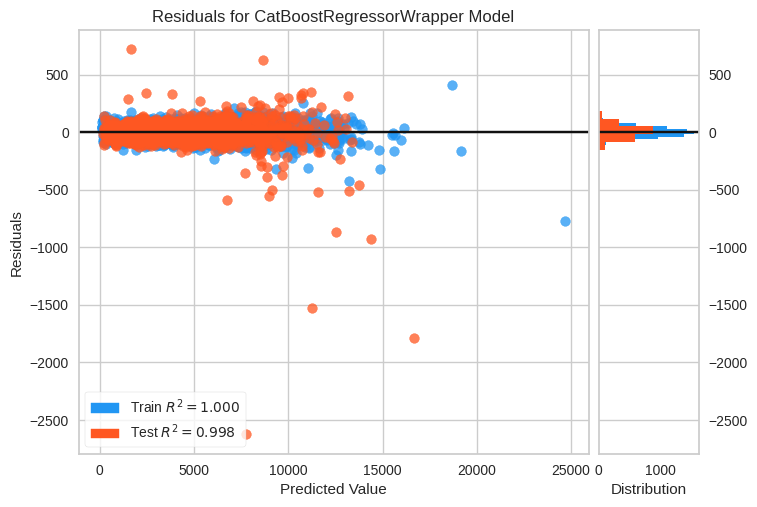

OK (0.7s)
  Running PredictionError... 

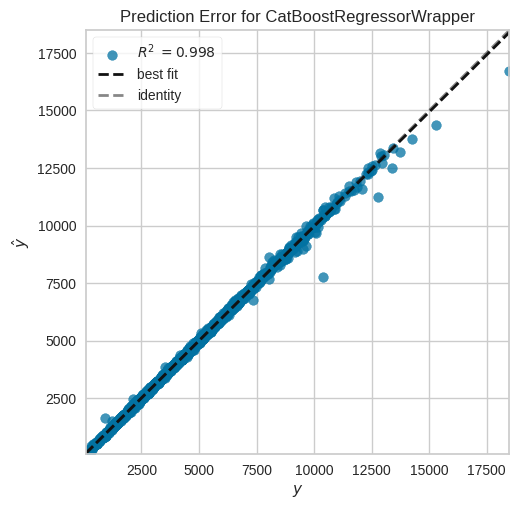

OK (0.3s)
  Running CooksDistance... FAILED: Axes.stem() got an unexpected keyword argument 'use_line_collection'

Regression Visualizers Summary:
  ✓ ResidualsPlot: SUCCESS (0.7s)
  ✓ PredictionError: SUCCESS (0.3s)
  ✗ CooksDistance: FAILED (0.1s)


In [104]:
# =============================================================================
# 1. REGRESSION VISUALIZERS
# ResidualsPlot, PredictionError, CooksDistance
# =============================================================================
print("=" * 70)
print("REGRESSION VISUALIZERS")
print("=" * 70)

regression_results = execute_regression_visualizers(
    kwargs=regression_kwargs,
    estimator=model,
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    verbose=True
)

# Summary
print("\nRegression Visualizers Summary:")
for r in regression_results:
    status_icon = "✓" if r["status"] == "SUCCESS" else "✗"
    print(f"  {status_icon} {r['name']}: {r['status']} ({r['time']:.1f}s)")

FEATURE ANALYSIS VISUALIZERS
  Running Rank1D... 

/home/rafaelcoelho/Workbench/COELHORealTime/notebooks/.venv/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10000.
  res = hypotest_fun_out(*samples, **kwds)
/home/rafaelcoelho/Workbench/COELHORealTime/notebooks/.venv/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


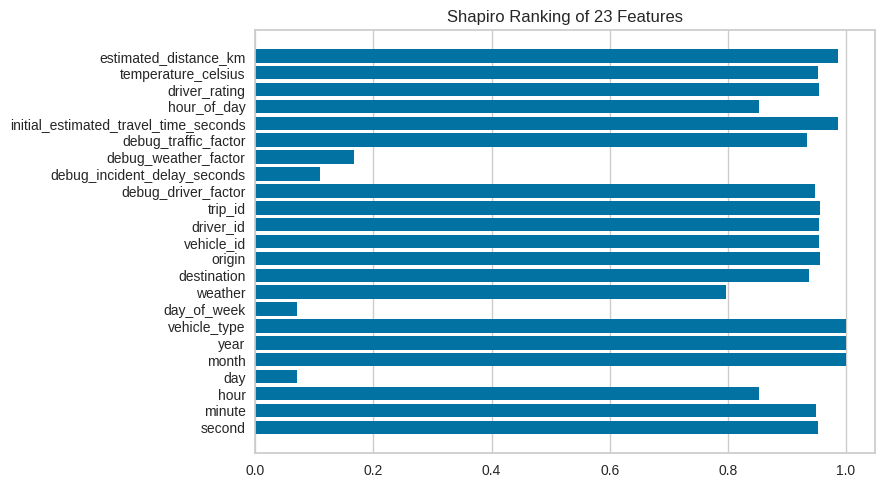

OK (0.3s)
  Running Rank2D... 

/home/rafaelcoelho/Workbench/COELHORealTime/notebooks/.venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/rafaelcoelho/Workbench/COELHORealTime/notebooks/.venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3024: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


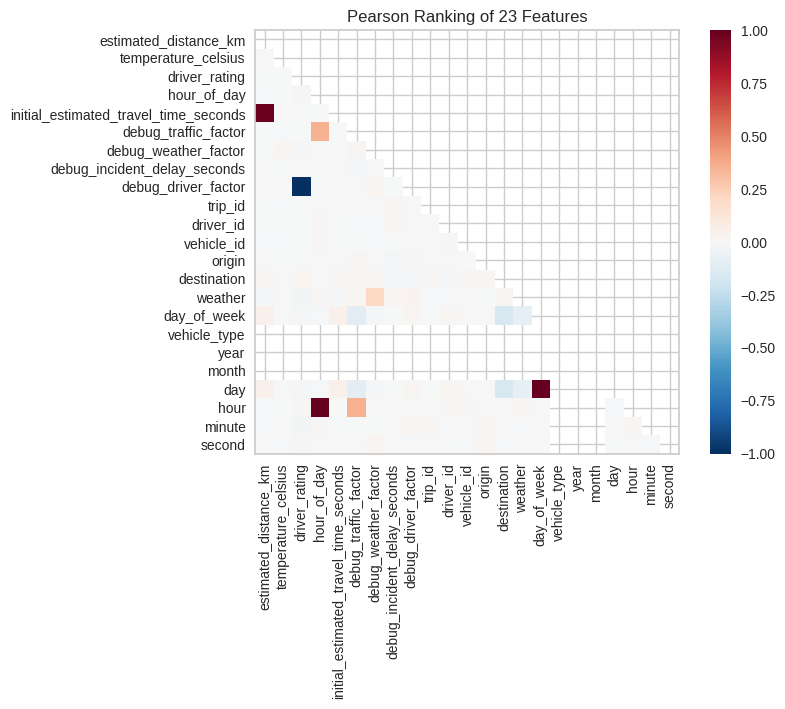

OK (0.4s)
  Running PCA... 

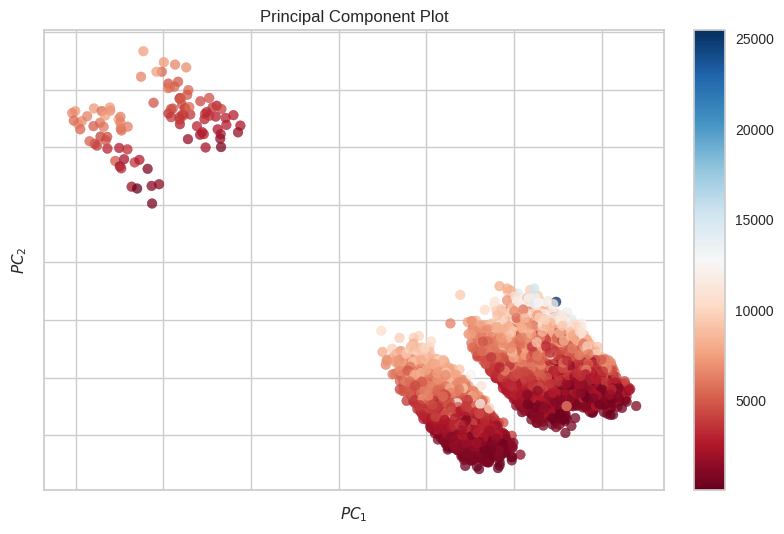

OK (1.1s)
  Running ParallelCoordinates... 

OK (71.1s)
  Running RadViz... 

/home/rafaelcoelho/Workbench/COELHORealTime/notebooks/.venv/lib/python3.13/site-packages/yellowbrick/features/radviz.py:134: RuntimeWarning: invalid value encountered in divide
  return (X - a[np.newaxis, :]) / ((b - a)[np.newaxis, :])


OK (282.4s)
  Running JointPlot... 

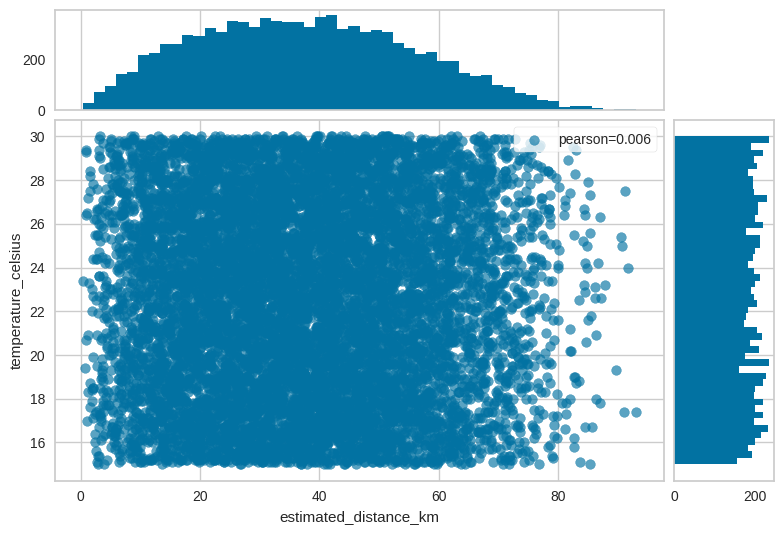

OK (4.5s)

Feature Analysis Visualizers Summary:
  ✓ Rank1D: SUCCESS (0.3s)
  ✓ Rank2D: SUCCESS (0.4s)
  ✓ PCA: SUCCESS (1.1s)
  ✓ ParallelCoordinates: SUCCESS (71.1s)
  ✓ RadViz: SUCCESS (282.4s)
  ✓ JointPlot: SUCCESS (4.5s)


In [105]:
# =============================================================================
# 2. FEATURE ANALYSIS VISUALIZERS
# Rank1D, Rank2D, PCA
# =============================================================================
print("=" * 70)
print("FEATURE ANALYSIS VISUALIZERS")
print("=" * 70)

# Combine train and test data for feature analysis
X_all = pd.concat([X_train, X_test], axis=0)
y_all = pd.concat([y_train, y_test], axis=0)

feature_analysis_results = execute_feature_analysis_visualizers(
    kwargs=feature_analysis_kwargs,
    X=X_all,
    y=y_all,
    verbose=True
)

# Summary
print("\nFeature Analysis Visualizers Summary:")
for r in feature_analysis_results:
    status_icon = "✓" if r["status"] == "SUCCESS" else "✗"
    print(f"  {status_icon} {r['name']}: {r['status']} ({r['time']:.1f}s)")

TARGET ANALYSIS VISUALIZERS
  Running FeatureCorrelation_Pearson... 

/home/rafaelcoelho/Workbench/COELHORealTime/notebooks/.venv/lib/python3.13/site-packages/yellowbrick/target/feature_correlation.py:174: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  [pearsonr(x, y, **kwargs)[0] for x in np.asarray(X).T]


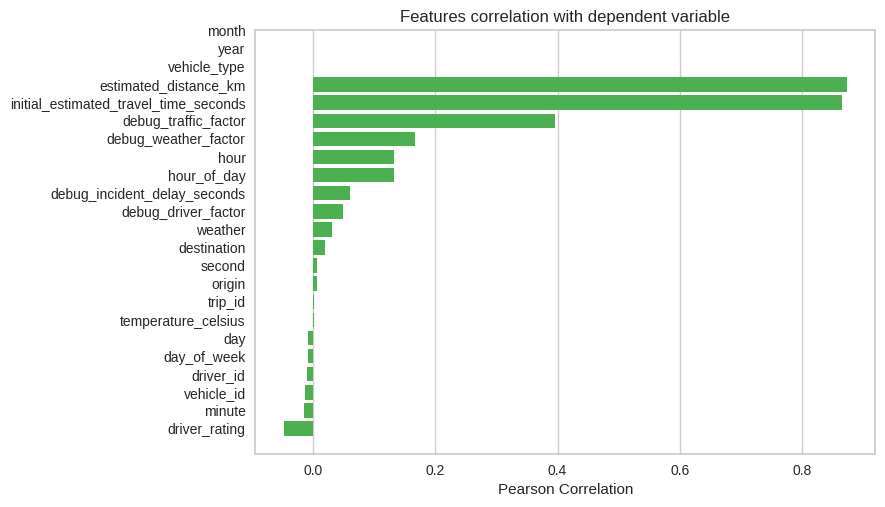

OK (1.3s)
  Running FeatureCorrelation_MutualInfo... 

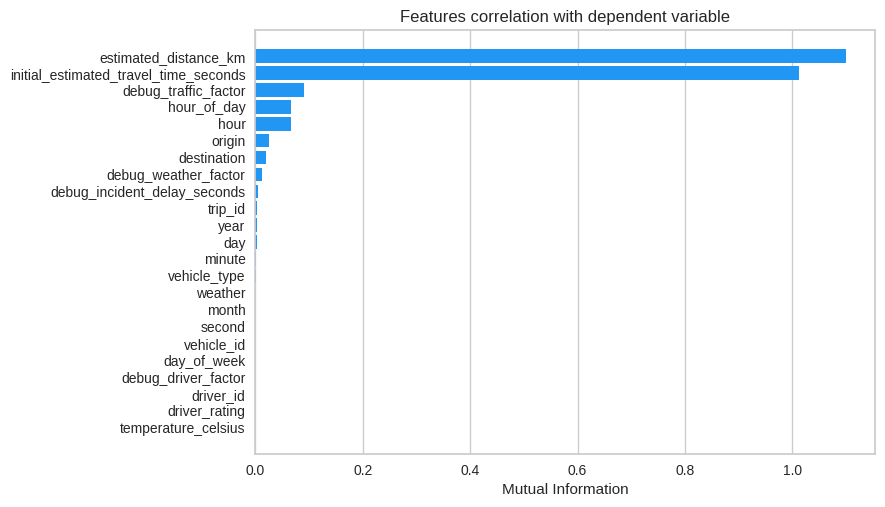

OK (5.3s)
  Running BalancedBinningReference... 

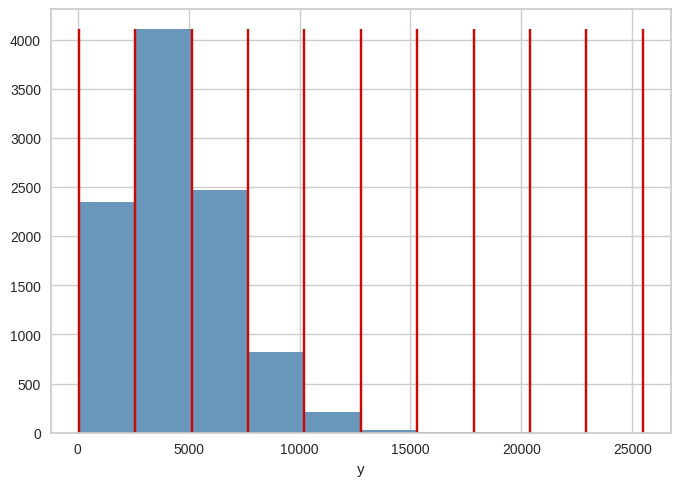

OK (0.4s)

Target Analysis Visualizers Summary:
  ✓ FeatureCorrelation_Pearson: SUCCESS (1.3s)
  ✓ FeatureCorrelation_MutualInfo: SUCCESS (5.3s)
  ✓ BalancedBinningReference: SUCCESS (0.4s)


In [106]:
# =============================================================================
# 3. TARGET ANALYSIS VISUALIZERS
# FeatureCorrelation (Pearson and Mutual Info)
# =============================================================================
print("=" * 70)
print("TARGET ANALYSIS VISUALIZERS")
print("=" * 70)

target_analysis_results = execute_target_analysis_visualizers(
    kwargs=target_analysis_kwargs,
    X=X_all,
    y=y_all,
    verbose=True
)

# Summary
print("\nTarget Analysis Visualizers Summary:")
for r in target_analysis_results:
    status_icon = "✓" if r["status"] == "SUCCESS" else "✗"
    print(f"  {status_icon} {r['name']}: {r['status']} ({r['time']:.1f}s)")

MODEL SELECTION VISUALIZERS
NOTE: CV-based visualizers (CVScores, LearningCurve, ValidationCurve) are SLOW

  Running FeatureImportances... 

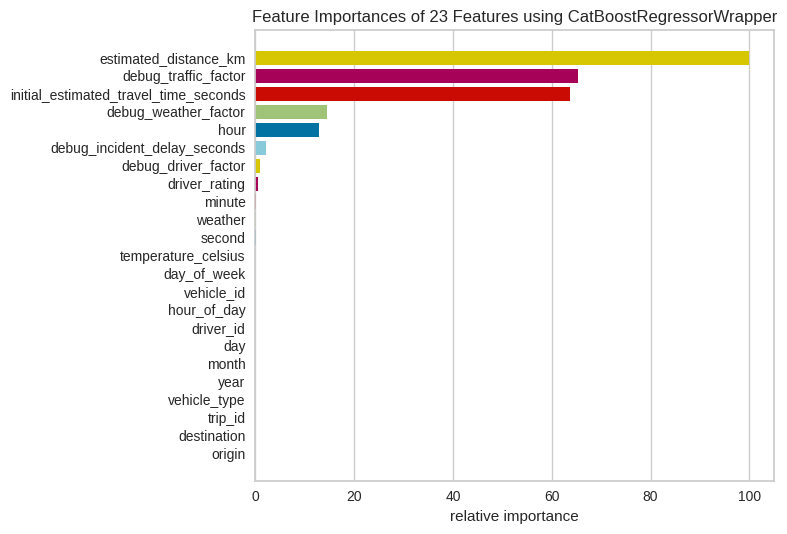

OK (2.0s)
  Running CVScores... 

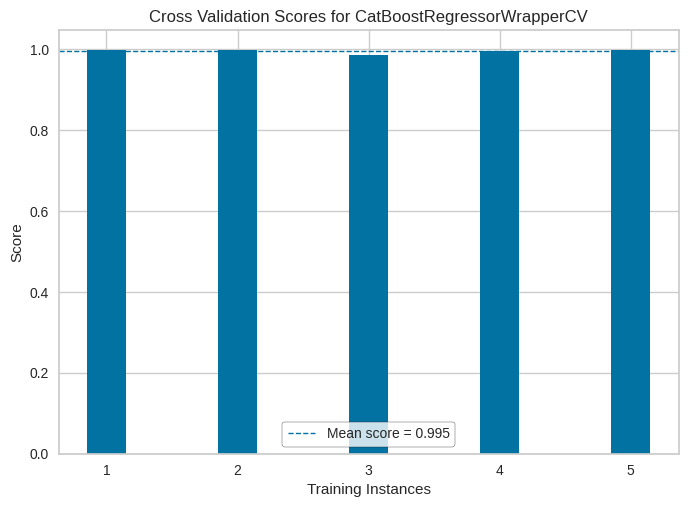

OK (26.9s)
  Running LearningCurve... 

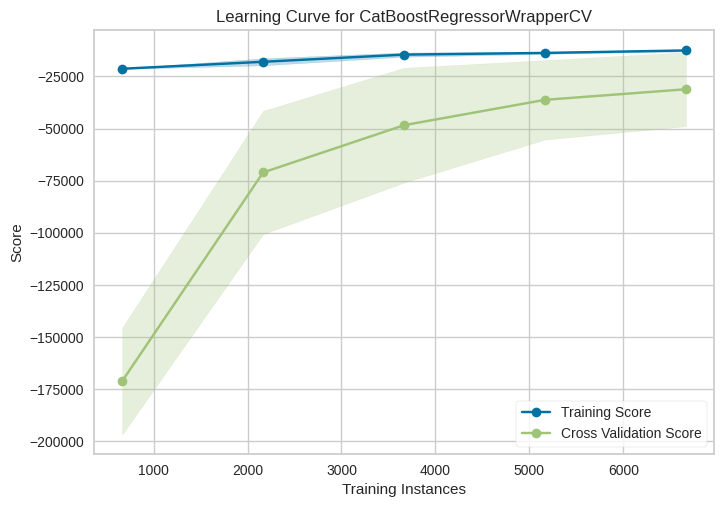

OK (55.5s)
  Running ValidationCurve... 

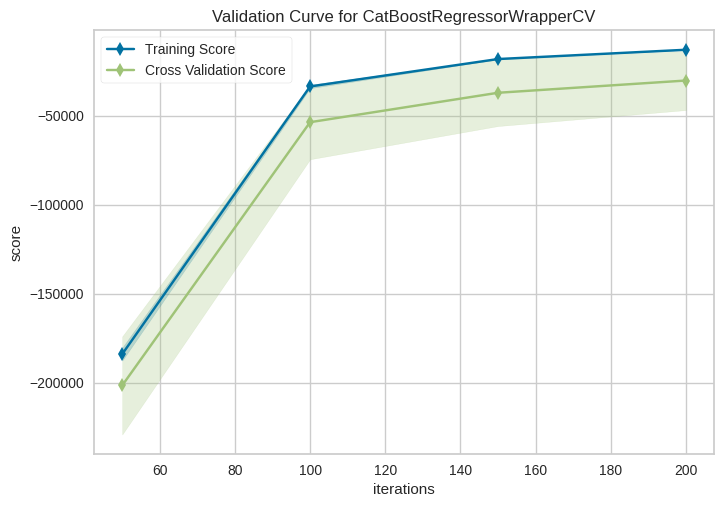

OK (31.2s)
  Running DroppingCurve... 

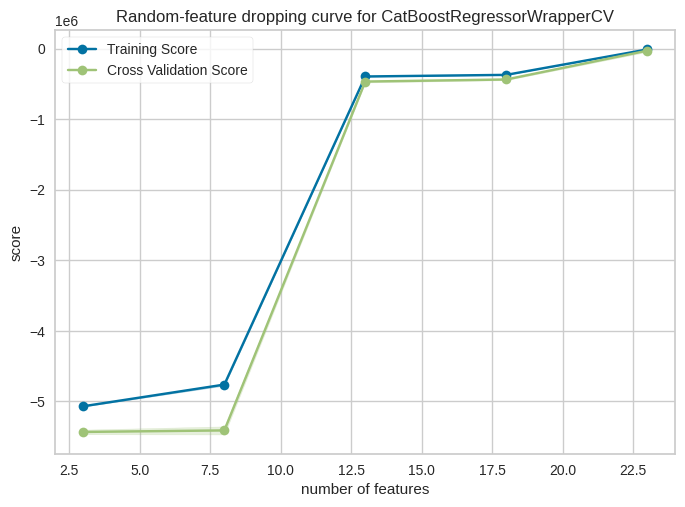

OK (37.8s)

Model Selection Visualizers Summary:
  ✓ FeatureImportances: SUCCESS (2.0s)
  ✓ CVScores: SUCCESS (26.9s)
  ✓ LearningCurve: SUCCESS (55.5s)
  ✓ ValidationCurve: SUCCESS (31.2s)
  ✓ DroppingCurve: SUCCESS (37.8s)


In [107]:
# =============================================================================
# 4. MODEL SELECTION VISUALIZERS
# FeatureImportances, CVScores, LearningCurve, ValidationCurve
# NOTE: CVScores, LearningCurve, ValidationCurve are SLOW (CV-based)
# =============================================================================
print("=" * 70)
print("MODEL SELECTION VISUALIZERS")
print("=" * 70)
print("NOTE: CV-based visualizers (CVScores, LearningCurve, ValidationCurve) are SLOW")
print()

model_selection_results = execute_model_selection_visualizers(
    kwargs=model_selection_kwargs,
    estimator=model,
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    verbose=True
)

# Summary
print("\nModel Selection Visualizers Summary:")
for r in model_selection_results:
    status_icon = "✓" if r["status"] == "SUCCESS" else "✗"
    print(f"  {status_icon} {r['name']}: {r['status']} ({r['time']:.1f}s)")

In [108]:
# =============================================================================
# FINAL SUMMARY - All YellowBrick Visualizations
# =============================================================================
print("=" * 70)
print("YELLOWBRICK VISUALIZATION SUMMARY (ETA)")
print("=" * 70)

all_results = (
    regression_results + 
    feature_analysis_results + 
    target_analysis_results + 
    model_selection_results
)

success_count = sum(1 for r in all_results if r["status"] == "SUCCESS")
failed_count = sum(1 for r in all_results if r["status"] == "FAILED")
total_time = sum(r["time"] for r in all_results)

print(f"\nTotal Visualizations: {len(all_results)}")
print(f"  Successful: {success_count}")
print(f"  Failed: {failed_count}")
print(f"  Total Time: {total_time:.1f}s")

print(f"\nOutput Directory: {YELLOWBRICK_PATH.absolute()}")
print("\nGenerated Files:")
for r in all_results:
    if r["output"]:
        status_icon = "✓" if r["status"] == "SUCCESS" else "✗"
        print(f"  {status_icon} {r['output']}")

# Show failed visualizers if any
if failed_count > 0:
    print("\nFailed Visualizers:")
    for r in all_results:
        if r["status"] == "FAILED":
            print(f"  - {r['name']}: {r['error']}")

YELLOWBRICK VISUALIZATION SUMMARY (ETA)

Total Visualizations: 17
  Successful: 16
  Failed: 1
  Total Time: 521.4s

Output Directory: /home/rafaelcoelho/Workbench/COELHORealTime/notebooks/../apps/reflex/coelho_realtime/assets/yellowbrick/eta

Generated Files:
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/regression/ResidualsPlot.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/regression/PredictionError.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/feature_analysis/Rank1D.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/feature_analysis/Rank2D.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/feature_analysis/PCA.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/feature_analysis/ParallelCoordinates.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/feature_analysis/RadViz.png
  ✓ ../apps/reflex/coelho_realtime/assets/yellowbrick/eta/feature_analysis/JointPlot.png
  ✓ ../apps/reflex/coelho_realtime